In [1]:
### load basic python libraries###
import numpy as np 
import h5py
import pandas as pd
import scanpy as sc
import matplotlib as plt
import scvelo as scv

%matplotlib inline
import matplotlib as plt

pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', None)
sc.set_figure_params(dpi = 150, dpi_save = 150, format = 'png')
sc._settings.ScanpyConfig(verbosity=0)

def clean_read(dataset: str) -> sc.AnnData:
    adata = sc.read_h5ad(dataset)
    
    # shorten metadata
    adata.obs = adata.obs[['seurat_clusters']]
    #adata.var = adata.var.reset_index().set_index('gene_ids')
    #adata.var = adata.var[['index']]
    del adata.obsm
    del adata.layers
    
    return adata


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
pd.set_option('display.max_rows', 1000)
np.random.seed(44)

## read human brain development atlase week 5 to 9

In [ ]:
hbd = sc.read_h5ad('/scratch/kgr851/datasets/human_brain_development/linnarsson/w5_9/hbd_w5_9.h5ad')
hbd.var_names_make_unique()

# since there are a lot of cells its good to randomly subsample them to avoid bias and ease computing

In [ ]:
##since there are a lot of cells its good to randomly subsample them to avoid bias and ease computing
sc.pp.subsample(hbd, n_obs=200000, random_state=0, copy=False)

In [ ]:
hbd.write('/scratch/kgr851/datasets/human_brain_development/linnarsson/w5_9/hbd_w5_9_subsampled.h5ad')

In [2]:
hbd = sc.read('/scratch/kgr851/datasets/human_brain_development/linnarsson/w5_9/hbd_w5_9_subsampled.h5ad')

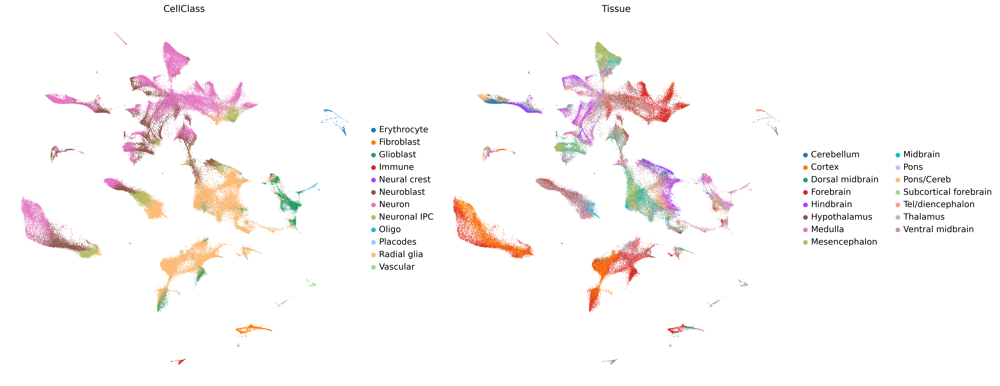

In [3]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(hbd, basis="X_embedding", color=["CellClass",'Tissue'], frameon=False, size=2)

## read the MiSTR dataset

In [5]:
mistr = sc.read_h5ad('/scratch/kgr851/adata/all_mistr/all_mistr_mnn.h5ad')

In [6]:
mistr_annotated = sc.read('/scratch/kgr851/datasets/mistr_dev/mistr_all_leiden_annotated_final_gsr.h5ad')
#transfer annotations 
mistr.obs['cell_type'] = mistr_annotated.obs['cell_type']

In [7]:
mistr.obs.groupby(['day','tissue']).apply(len)

day     tissue            
day 0    ES d 0                8197
day 01  R/C dorsal d 01        1033
        R/C ventral d 01       8887
day 02  R/C dorsal d 02        4555
        R/C ventral d 02       6547
day 05  D/V forebrain d 05     7639
        R/C dorsal d 05       15965
        R/C ventral d 05       9668
day 09  D/V forebrain d 09     6437
        R/C dorsal d 09       13449
        R/C ventral d 09      18024
day 14  D/V forebrain d 14     6840
        R/C dorsal d 14       19314
        R/C ventral d 14      13933
day 21  D/V forebrain d 21     6223
        R/C dorsal d 21       15013
        R/C ventral d 21      13249
day 35  D/V forebrain d 35     5823
        R/C dorsal d 35        9145
        R/C ventral d 35       7962
day 62  R/C dorsal d 62        2564
        R/C ventral d 62       5779
dtype: int64

In [9]:
##### susbset day 9 to 62 
mistr_d9_62 = mistr[mistr.obs['day'].isin(['day 09', 'day 14','day 21','day 35','day 62'])]


In [12]:
#mistr_d9_62.write("/scratch/kgr851/adata/all_mistr/mistr_d9_62.h5ad")

In [13]:
hbd

AnnData object with n_obs × n_vars = 200000 × 59480
    obs: 'CellID', 'CellClass', 'Chemistry', 'Tissue', 'Subregion', 'Age'
    uns: 'Age_colors', 'CellClass_colors', 'Tissue_colors'
    obsm: 'X_embedding'

In [14]:
#####save the embeddings for later visualisation 

hbd_embedding = hbd.obsm['X_embedding']
mistr_d9_62_embedding = mistr_d9_62.obsm['X_umap']       

# scvi tools start

In [15]:
#############select common genes for projection analysis######
var_names = mistr_d9_62.var_names.intersection(hbd.var_names)
hbd = hbd[:, var_names]
mistr_d9_62 = mistr_d9_62[:, var_names]

In [16]:
hbd.layers["counts"] = hbd.X.copy()
hbd.raw = hbd

In [17]:
## add study to metadata 
mistr_d9_62.obs['study'] = 'mistr'
hbd.obs['study'] = 'hbd'

## now concatenate

In [18]:
adata = hbd.concatenate(mistr_d9_62, batch_key=None)
adata

AnnData object with n_obs × n_vars = 343755 × 30142
    obs: 'CellID', 'CellClass', 'Chemistry', 'Tissue', 'Subregion', 'Age', 'study', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.4', 'seurat_clusters', 'day', 'model', 'tissue', 'source', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'SCT_snn_res.1.2', 'nCount_integrated', 'nFeature_integrated', 'ident', 'cell_type'
    layers: 'counts'

In [19]:
sc.pp.normalize_total(adata, target_sum=10_000)
sc.pp.log1p(adata)

In [20]:
adata

AnnData object with n_obs × n_vars = 343755 × 30142
    obs: 'CellID', 'CellClass', 'Chemistry', 'Tissue', 'Subregion', 'Age', 'study', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.4', 'seurat_clusters', 'day', 'model', 'tissue', 'source', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'SCT_snn_res.1.2', 'nCount_integrated', 'nFeature_integrated', 'ident', 'cell_type'
    uns: 'log1p'
    layers: 'counts'

In [21]:
mistr_pred = adata[adata.obs.study.isin(["mistr"])].copy()

adata = adata[~adata.obs.study.isin(["mistr"])].copy()

In [22]:
adata.raw = adata  # keep full dimension safe
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=2_000,
    layer="counts",
    subset=True
)

In [23]:
#adata.write("/scratch/kgr851/home/dataset_comparision/useful_adata//new/hbd_adata_ready_for_scvi.h5ad")
#mistr_pred.write("/scratch/kgr851/home/dataset_comparision/useful_adata/new/mistr_pred_ready_for_scvi.h5ad")

In [24]:
### read adata 
#adata = sc.read_h5ad("/scratch/kgr851/home/dataset_comparision/useful_adata/hbd_adata_ready_for_scvi.h5ad")
#mistr_pred = sc.read_h5ad("/scratch/kgr851/home/dataset_comparision/useful_adata/mistr_pred_ready_for_scvi.h5ad")

In [25]:
adata.obs.groupby(['Tissue']).apply(len)

Tissue
Cerebellum                6436
Cortex                   19948
Dorsal midbrain           1940
Forebrain                38645
Hindbrain                12395
Hypothalamus              2735
Medulla                  18503
Mesencephalon            24279
Midbrain                 16144
Pons                      4501
Pons/Cereb               16081
Subcortical forebrain     5670
Tel/diencephalon          8155
Thalamus                 18561
Ventral midbrain          6007
dtype: int64

# merge these tissue for general forebrain midbrain and hindbrain cells 

In [26]:
adata.obs['Tissue'][adata.obs['Tissue'].isin(['Cortex', 'Subcortical forebrain','Tel/diencephalon','Thalamus','Hypothalamus'])]='Forebrain'
adata.obs['Tissue'][adata.obs['Tissue'].isin(['Mesencephalon','Ventral midbrain','Dorsal midbrain'])]='Midbrain'
adata.obs['Tissue'][adata.obs['Tissue'].isin(['Cerebellum','Medulla','Pons','Pons/Cereb'])]='Hindbrain'
adata.obs['Tissue']=adata.obs['Tissue'].astype('str').astype('category')


In [27]:
adata.obs.groupby(['Tissue']).apply(len)

Tissue
Forebrain    93714
Hindbrain    57916
Midbrain     48370
dtype: int64

# SCVI

In [28]:
import scvi

from scvi.model.utils import mde


Global seed set to 0


In [29]:
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="Age")

In [30]:
arches_params = dict(
    use_layer_norm="both",
     use_batch_norm="none",
     encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
)

vae = scvi.model.SCVI(adata, **arches_params)
#vae = scvi.model.SCVI(adata, n_layers=2, dispersion='gene-batch', dropout_rate=0.2, gene_likelihood="zinb", n_latent=30)
# vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30)

In [31]:
vae

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb, latent_distribution: normal
Training status: Not Trained

In [32]:
#vae.train(use_gpu=1, early_stopping=True, max_epochs=100, train_size=0.75)
vae.train(use_gpu=2, early_stopping=True, max_epochs=400, train_size=0.75,check_val_every_n_epoch=5)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 400/400: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [1:19:44<00:00, 11.96s/it, loss=520, v_num=1]


<Axes: xlabel='epoch'>

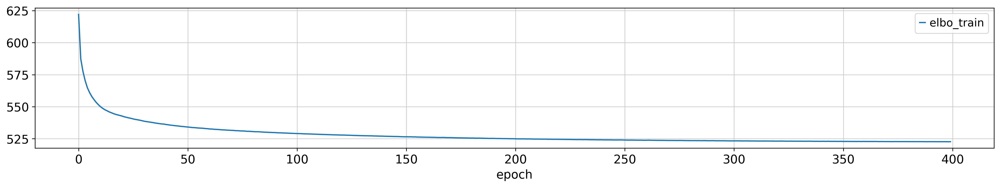

In [33]:
vae.history['elbo_train'].plot(figsize=[20,3])

In [34]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(adata, use_rep="X_scVI")
#sc.tl.leiden(adata)
#sc.tl.umap(adata)

adata.obsm["X_scVI"] = vae.get_latent_representation()
adata.obsm["X_mde"] = mde(adata.obsm["X_scVI"])

In [35]:
adata

AnnData object with n_obs × n_vars = 200000 × 2000
    obs: 'CellID', 'CellClass', 'Chemistry', 'Tissue', 'Subregion', 'Age', 'study', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.4', 'seurat_clusters', 'day', 'model', 'tissue', 'source', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'SCT_snn_res.1.2', 'nCount_integrated', 'nFeature_integrated', 'ident', 'cell_type', '_scvi_batch', '_scvi_labels'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors'
    obsm: 'X_scVI', 'X_mde'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [ ]:
# scv.pl.scatter(adata, groups=[[c] for c in adata.obs['Tissue'].cat.categories], color='Tissue', ncols=4,basis = 'X_mde')

In [39]:
vae.save("/scratch/kgr851/home//dataset_comparision/hbd_merge_tissue/new/data/models/03_model", overwrite=True)

# SCANVI

In [40]:
adata.obs["labels_scanvi"] = adata.obs["Tissue"].values

In [41]:
lvae_scan = scvi.model.SCANVI.from_scvi_model(vae, unlabeled_category="Unknown", labels_key="labels_scanvi")

In [42]:
lvae_scan

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.2, 
dispersion: gene, gene_likelihood: zinb
Training status: Not Trained

In [43]:
lvae_scan.train(max_epochs=100,early_stopping=True, n_samples_per_label=100, use_gpu=3)

INFO     Training for 100 epochs.                                                            


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 100/100: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [41:37<00:00, 24.98s/it, loss=537, v_num=1]


<Axes: xlabel='epoch'>

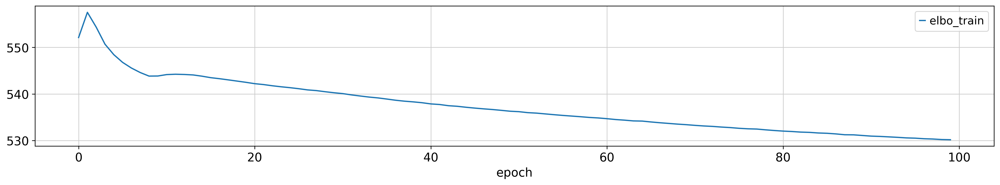

In [44]:
lvae_scan.history['elbo_train'].plot(figsize=[20,3])

In [45]:
adata.obsm["X_scANVI"] = lvae_scan.get_latent_representation()
sc.pp.neighbors(adata, use_rep="X_scANVI")
#sc.tl.leiden(adata)
#sc.tl.umap(adata)

adata.obsm["X_mde_2"] = mde(adata.obsm["X_scANVI"])

In [48]:
#with plt.rc_context({"figure.figsize": [10, 10]}):
#    sc.pl.embedding(adata, basis="X_mde_2", color=["HOXB2"],size = 10, frameon=False, wspace = 0.5, legend_fontsize = 6,save = 'hbd_tissue_HOXB2.svg',color_map='YlGnBu')

In [51]:
lvae_scan.save("/scratch/kgr851/home//dataset_comparision/hbd_merge_tissue/data/models/new/03_model", overwrite=True, save_anndata=True)

In [52]:
mistr_pred.obs['Age'] = mistr_pred.obs['day']

In [53]:
#scvi.model.SCVI.prepare_query_anndata(mistr_pred, "/scratch/kgr851/home/dataset_comparision/hbd_merge_tissue/data/models/new/03_model")
scvi.model.SCVI.prepare_query_anndata(mistr_pred, lvae_scan)

INFO     Found 100.0% reference vars in query data.                                          


In [54]:
vae_q = scvi.model.SCANVI.load_query_data(mistr_pred, "/scratch/kgr851/home//dataset_comparision/hbd_merge_tissue/data/models/new/03_model")
#vae_q = scvi.model.SCANVI.load_query_data(mistr_pred, lvae_scan)

INFO     File /scratch/kgr851/home//dataset_comparision/hbd_merge_tissue/data/models/new/03_m
         odel/model.pt already downloaded                                                    


In [55]:
vae_q.train(max_epochs=40, plan_kwargs=dict(weight_decay=0.0), use_gpu=True, check_val_every_n_epoch=10)

INFO     Training for 40 epochs.                                                             


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 40/40: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [08:01<00:00, 12.05s/it, loss=466, v_num=1]


<Axes: xlabel='epoch'>

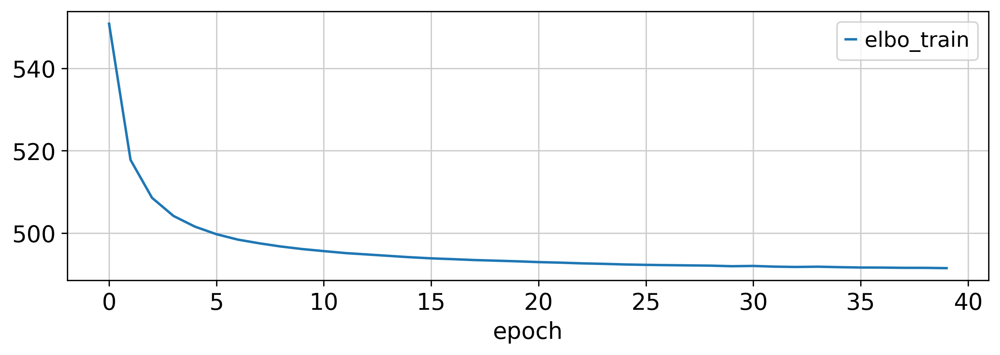

In [56]:
vae_q.history['elbo_train'].plot(figsize=[10,3])

In [57]:
mistr_pred.obsm["X_scANVI"] = vae_q.get_latent_representation()
mistr_pred.obsm["X_mde"] = mde(mistr_pred.obsm["X_scANVI"])

In [58]:
mistr_pred.obs["predictions"] = vae_q.predict()

In [ ]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(mistr_pred, basis="X_mde", color=["tissue"],size = 10, frameon=False, wspace = 0.5, legend_fontsize = 6,save = 'mistr_prediction_hbd_mistr_days.svg')

In [ ]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(mistr_pred, basis="X_mde", color=["predictions"],size = 10, frameon=False, wspace = 0.5, legend_fontsize = 6,save = 'mistr_prediction_hbd_tissue.svg')

In [ ]:
sc.pl.embedding(mistr_pred, basis="X_mde", color=['FGF17','WNT1'],color_map='Spectral_r' ,frameon=False, wspace = 0.5, legend_fontsize = 6,legend_loc = 'on data')

predictions,Forebrain,Hindbrain,Midbrain
tissue,,,
D/V forebrain d 09,6385,12,40
D/V forebrain d 14,6805,11,24
D/V forebrain d 21,6016,76,131
D/V forebrain d 35,5046,521,256
R/C dorsal d 09,5577,6206,1666
R/C ventral d 09,6940,7324,3760
R/C dorsal d 14,8761,8782,1771
R/C ventral d 14,4122,7376,2435
R/C dorsal d 21,5832,8050,1131


[]

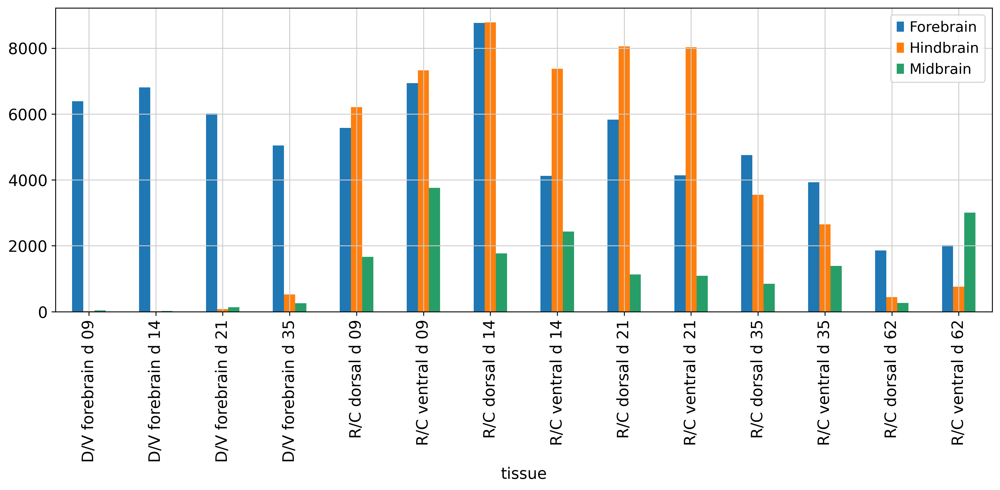

In [110]:
df = mistr_pred.obs.groupby(['tissue', 'predictions']).count()['day'].unstack()\
    .loc[['D/V forebrain d 09','D/V forebrain d 14','D/V forebrain d 21','D/V forebrain d 35','R/C dorsal d 09','R/C ventral d 09','R/C dorsal d 14','R/C ventral d 14',
         'R/C dorsal d 21','R/C ventral d 21','R/C dorsal d 35','R/C ventral d 35','R/C dorsal d 62','R/C ventral d 62']]

display(df)
ax = df.plot.bar(figsize=[15, 5])
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()
#plt.pyplot.savefig("mistr_hbd_predictionbased on tissue_anno.svg", dpi=150, bbox_inches = "tight")

In [111]:
df.to_csv('mistr_pred_with_hbd_merge_tissue_mistr_tissue.csv')

In [ ]:
df = mistr_pred.obs.groupby(['day', 'predictions']).count()['tissue'].unstack()\
    .loc[['day 09', 'day 14', 'day 21', 'day 35', 'day 62']]

display(df)
ax = df.plot.bar(figsize=[15, 5])

ax.set_title("Predicted Mistr cells",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()
plt.pyplot.savefig("mistr_timepoints_hbd_predictionbased on tissue_anno.svg", dpi=150, bbox_inches = "tight")

In [64]:
## now lets use the map cordinates we used before 


adata.obsm['X_embedding'] = hbd_embedding
mistr_pred.obsm['X_umap']  = mistr_d9_62_embedding       

In [65]:
## save te trained reference and queries for future 
adata_save = adata.copy()
mistr_pred_save = mistr_pred.copy()

del(adata_save.obs['CellID'])
del(mistr_pred_save.obs['CellID'])

mistr_pred_save.write("/scratch/kgr851/scvi_analysis/mistr_pred_hbd_tissue_v2/mistr_pred_hbd_tissue.h5ad")

adata_save.write("/scratch/kgr851/scvi_analysis/mistr_pred_hbd_tissue_v2/hbd_tissue.h5ad")


In [ ]:
#mistr_pred.uns['predictions_colors'] = ['#1f77b4','#ff7f0e', '#279e68' ]

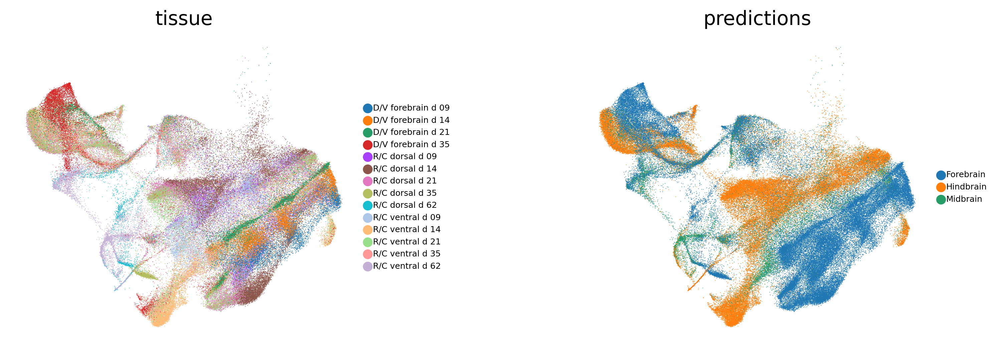

In [66]:
sc.pl.embedding(mistr_pred, basis="X_umap", color=["tissue", "predictions"], frameon=False, wspace = 0.5, legend_fontsize = 6)

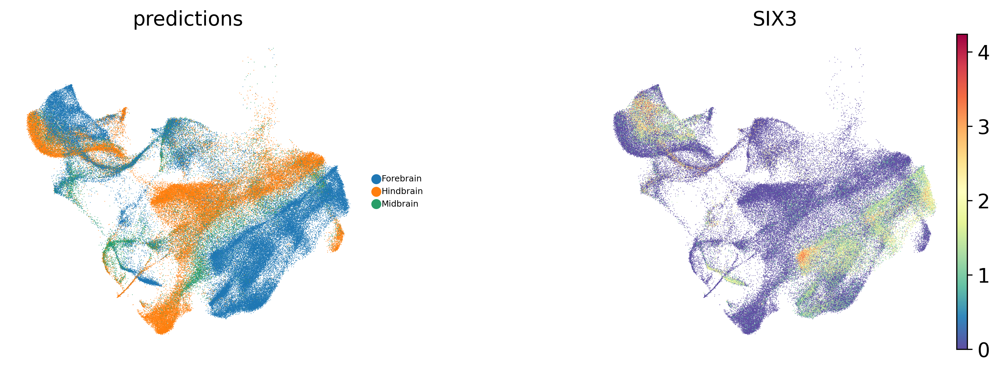

In [68]:
sc.pl.embedding(mistr_pred, basis="X_umap", color=["predictions",'SIX3'],color_map = 'Spectral_r' ,frameon=False, wspace = 0.5, legend_fontsize = 6)

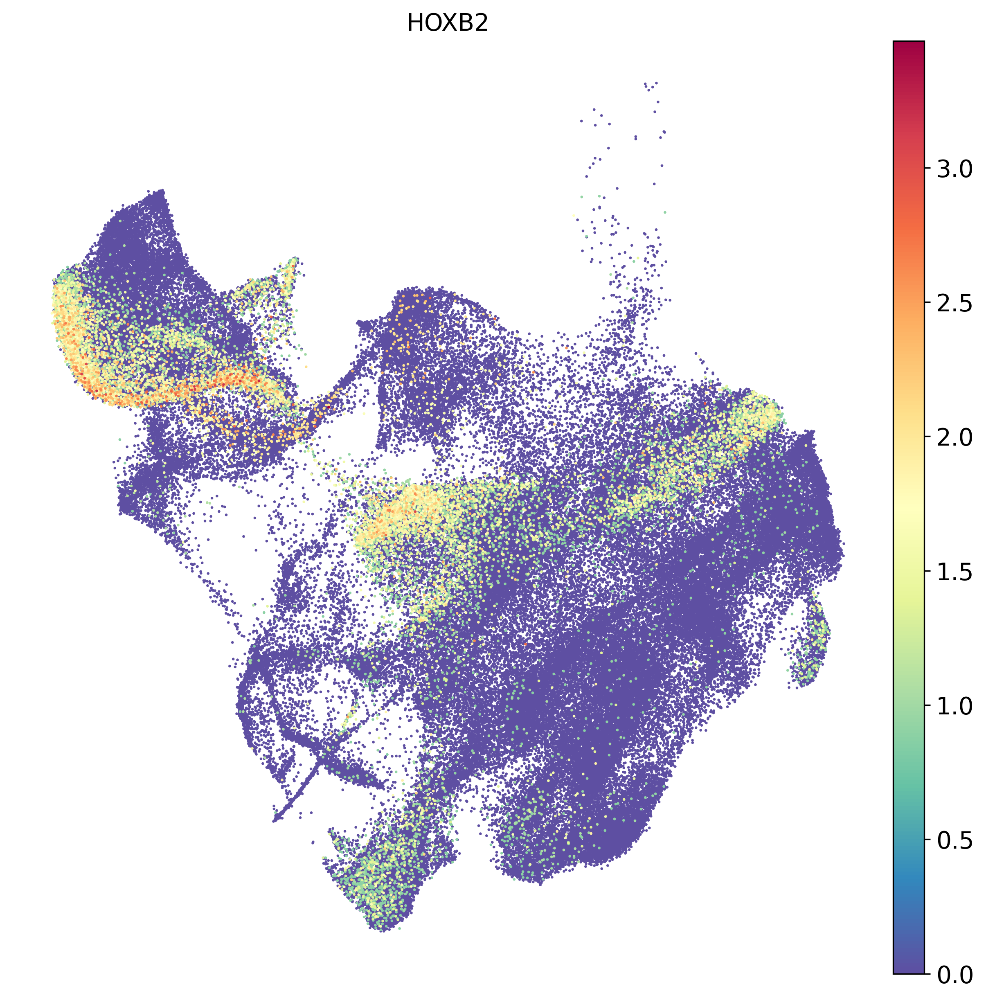

In [164]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(mistr_pred, basis="X_umap", color=["HOXB2"],size = 10, frameon=False, wspace = 0.5, 
                    legend_fontsize = 6,save = 'mistr_pred_tissue_HOXB2.svg',color_map='Spectral_r')

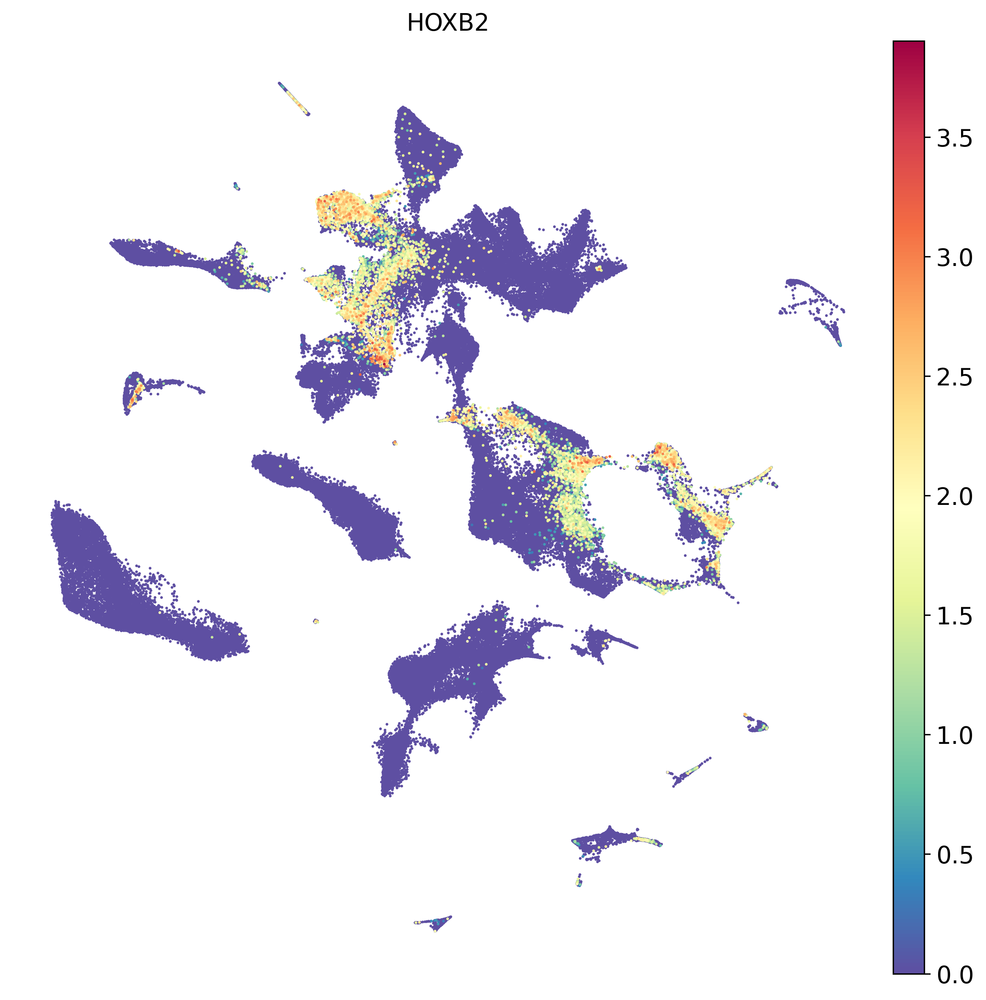

In [165]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(adata, basis="X_embedding", color=["HOXB2"],size = 10, frameon=False, wspace = 0.5, 
                    legend_fontsize = 6,save = 'hbd_tissue_HOXB2.svg',color_map='Spectral_r')

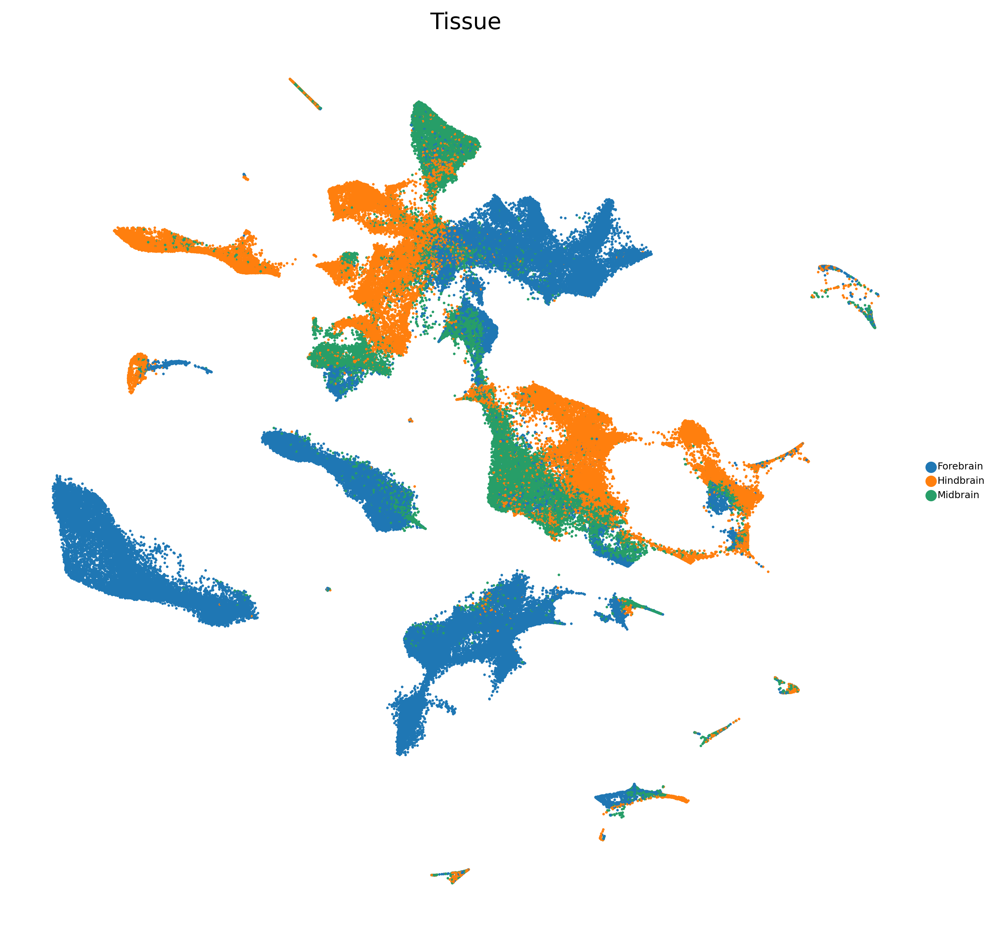

In [115]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(adata, basis="X_embedding", color=["Tissue"],size = 10,color_map = 'Spectral_r', save = 'hbd_tissue_og_embedding.svg' ,frameon=False, wspace = 0.5, legend_fontsize = 6)

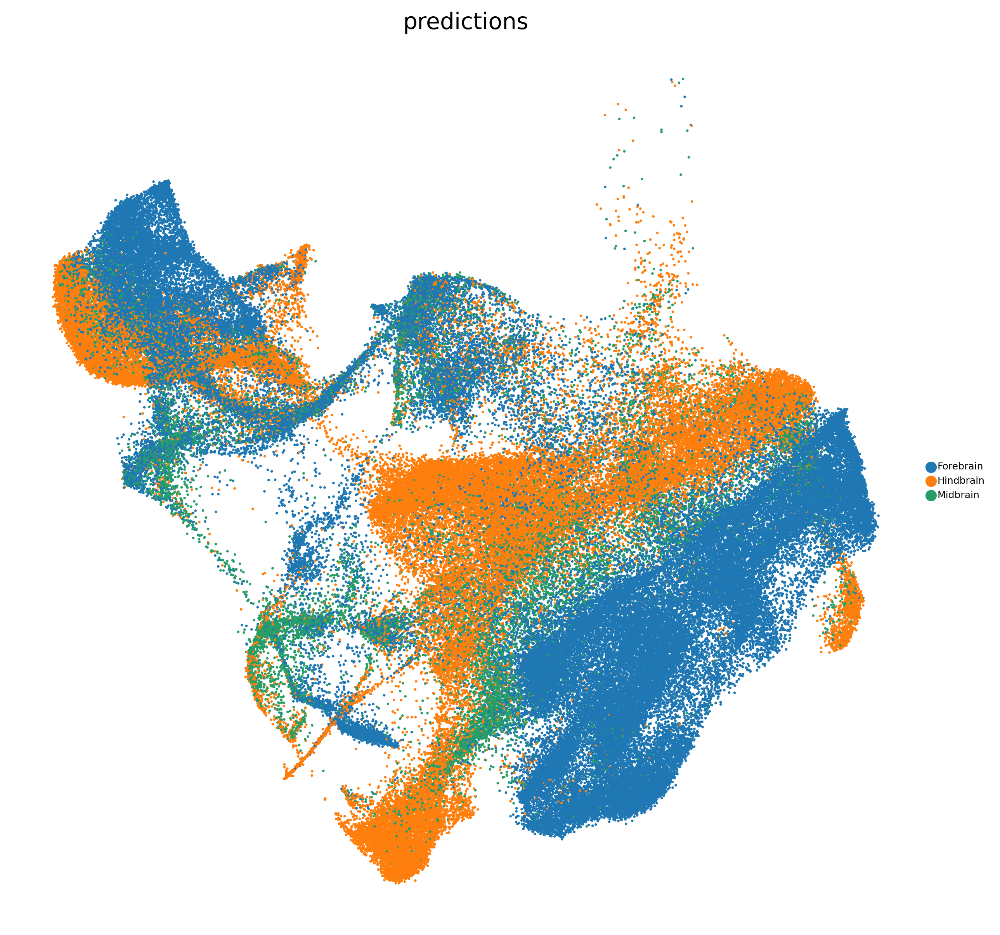

In [116]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(mistr_pred, basis="X_umap", color=["predictions"],size = 10,color_map = 'Spectral_r', save = 'day_9_62_mistr_predicted_hbd.svg' ,frameon=False, wspace = 0.5, legend_fontsize = 6)

In [ ]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(mistr_pred, basis="X_umap", color=["predictions"],size = 10, frameon=False, wspace = 0.5, legend_fontsize = 6,save = 'mistr_prediction_hbd_tissue.svg')

In [ ]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(mistr_pred, basis="X_umap", color=["HOXB2"],size = 10, frameon=False, wspace = 0.5, legend_fontsize = 6,save = 'mistr_prediction_hbd_tissue_HOXB2.svg', color_map = 'YlGnBu')

In [ ]:
df.to_csv('mistr_pred_with_hbd_tissue.csv')

In [ ]:
#######save the adata for future######


In [73]:
df_counts = pd.DataFrame([adata.obs.groupby(['Tissue']).apply(len), mistr_pred.obs.groupby(['predictions']).apply(len)], index=['Reference', 'Query']).T

In [74]:
df_perc = pd.DataFrame(np.round(df_counts.values / df_counts.sum(axis=1)[:, np.newaxis], 2) * 100, columns=['Reference', 'Query'], index=df_counts.index)

In [ ]:
df = mistr_pred.obs.groupby(['tissue']).apply(len)
df.plot.pie(y='tissue', figsize=(5, 5))
plt.pyplot.ylabel('')
plt.pyplot.show()

In [ ]:
df = adata.obs.groupby(['Age']).apply(len)
df.plot.pie(y='Age', figsize=(5, 5))
plt.pyplot.ylabel('')
plt.pyplot.show()

## analyse ref and query inspired from https://docs.scvi-tools.org/en/stable/tutorials/notebooks/scrna/scarches_scvi_tools.html



In [99]:
import anndata as anndata

adata_save = adata.copy()
mistr_pred_save = mistr_pred.copy()

del(adata_save.obs['CellID'])
del(mistr_pred_save.obs['CellID'])

##### add aditional infor for later plotting
adata_save.obs['HBD_age'] = adata_save.obs['Age']
mistr_pred_save.obs['MiSTR_age'] = mistr_pred_save.obs['day']

mistr_pred_save.obs['MiSTR_predictions'] = mistr_pred_save.obs['predictions']


In [100]:


#comparision_full = anndata.concat([mistr_pred_save, adata_save], label="study")
#comparision_full

comparision_full = mistr_pred_save.concatenate(adata_save, batch_key=None)
comparision_full


AnnData object with n_obs × n_vars = 343755 × 2000
    obs: 'CellClass', 'Chemistry', 'Tissue', 'Subregion', 'Age', 'study', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.4', 'seurat_clusters', 'day', 'model', 'tissue', 'source', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'SCT_snn_res.1.2', 'nCount_integrated', 'nFeature_integrated', 'ident', 'cell_type', '_scvi_batch', 'labels_scanvi', '_scvi_labels', 'predictions', 'MiSTR_age', 'MiSTR_predictions', 'HBD_age'
    var: 'highly_variable-1', 'highly_variable_rank-1', 'means-1', 'variances-1', 'variances_norm-1'
    obsm: 'X_mde', 'X_scANVI'
    layers: 'counts'

In [101]:
#comparision_full.obs["study"] = comparision_full.obs["study"].cat.rename_categories(
#    ["MiSTR", "hbd"]
#)

In [102]:
full_predictions = vae_q.predict(comparision_full)
print(f"Acc: {np.mean(full_predictions == comparision_full.obs['Tissue'])}")

comparision_full.obs["predictions"] = full_predictions



INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       
Acc: 0.5271836046021149


In [103]:
sc.pp.neighbors(comparision_full, use_rep="X_scANVI")
#sc.tl.leiden(pancreas_full)
sc.tl.umap(comparision_full)

In [ ]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(comparision_full, basis="X_umap", color=["study",'Tissue','predictions','PAX8','LMX1A','SHH'],size = 10, frameon=False, wspace = 0.5, legend_fontsize = 6, color_map = 'Spectral_r')

In [143]:
comparision_full_plot = comparision_full.copy()
comparision_full_plot

AnnData object with n_obs × n_vars = 343755 × 2000
    obs: 'CellClass', 'Chemistry', 'Tissue', 'Subregion', 'Age', 'study', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.4', 'seurat_clusters', 'day', 'model', 'tissue', 'source', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'SCT_snn_res.1.2', 'nCount_integrated', 'nFeature_integrated', 'ident', 'cell_type', '_scvi_batch', 'labels_scanvi', '_scvi_labels', 'predictions', 'MiSTR_age', 'MiSTR_predictions', 'HBD_age'
    var: 'highly_variable-1', 'highly_variable_rank-1', 'means-1', 'variances-1', 'variances_norm-1'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'study_colors', 'Tissue_colors', 'predictions_colors', 'model_colors', 'HBD_age_colors'
    obsm: 'X_mde', 'X_scANVI', 'X_umap'
   

In [145]:
comparision_full_plot.obs['study']

d09d_AAACCCAAGAGTGAAG-1-0        mistr
d09d_AAACCCAAGGGTGGGA-1-0        mistr
d09d_AAACCCAAGTATGATG-1-0        mistr
d09d_AAACCCACAATCGCAT-1-0        mistr
d09d_AAACCCACATATTCGG-1-0        mistr
                                 ...  
10X119_7:CTGGTCTAGACCACGA-0-1      hbd
10X112_2:TGCACCTTCTTGGGTA-0-1      hbd
10X115_3:TCCACACAGAGCTATA-0-1      hbd
10X114_4:TGGACGCGTTACGGAG-0-1      hbd
10X110_6:AGGGTGATCGTCTGCT-0-1      hbd
Name: study, Length: 343755, dtype: category
Categories (2, object): ['hbd', 'mistr']

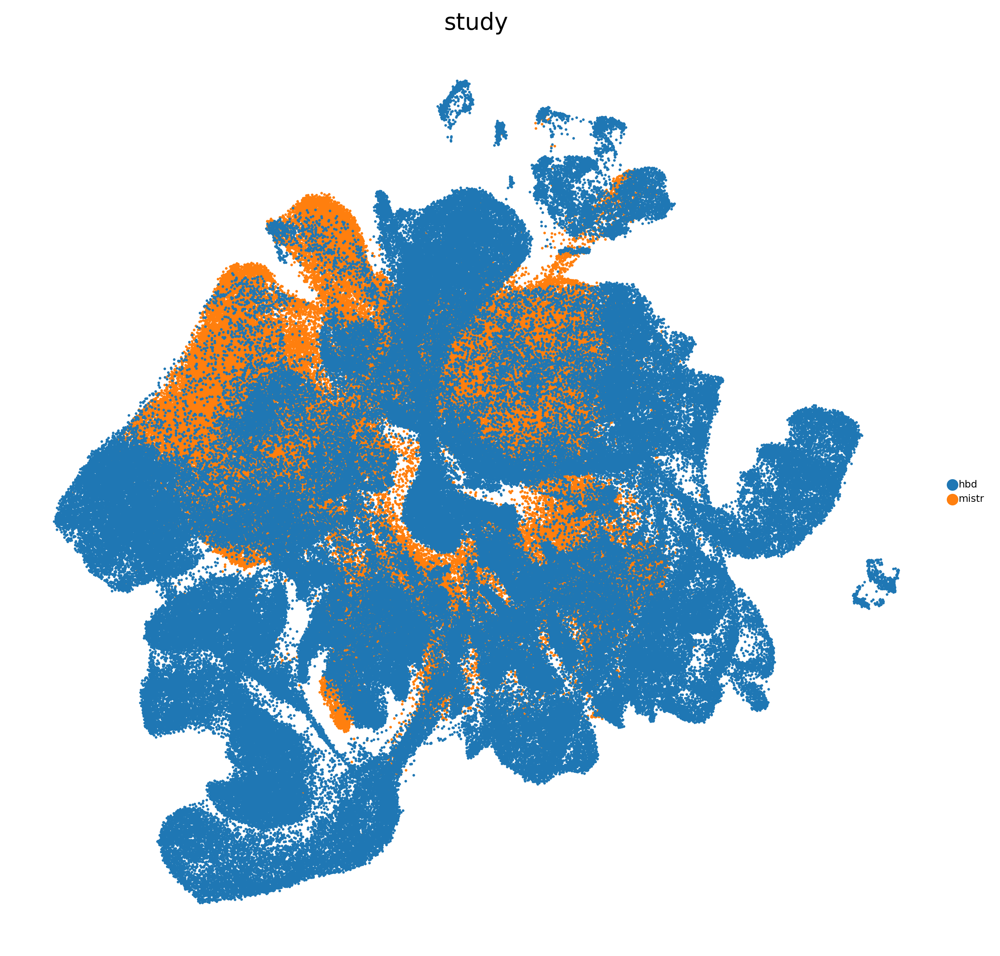

In [175]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(comparision_full, basis="X_umap", color=["study"],sort_order=True
                    ,size = 10,frameon=False,wspace = 0.5, legend_fontsize = 6, color_map = 'Spectral_r',save = 'hbd_w5-9_mistr_d9-62_integrated.svg')

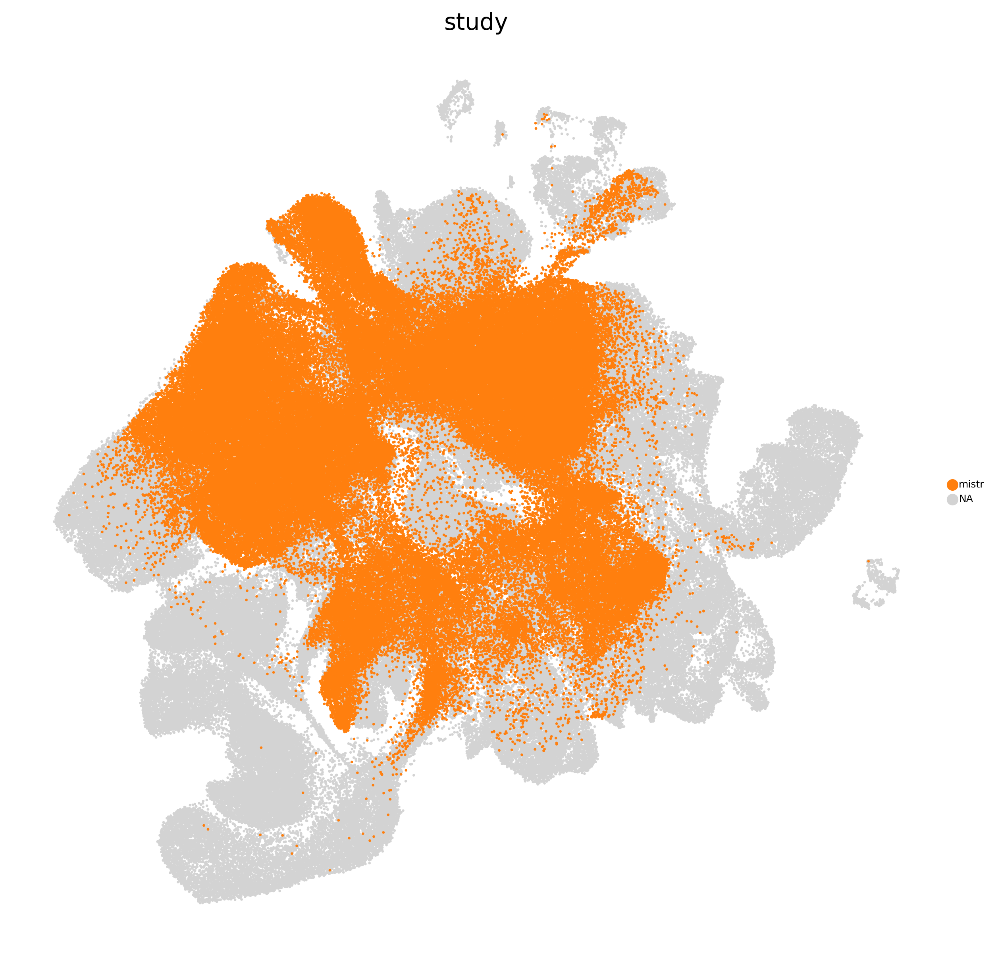

In [179]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(comparision_full, basis="X_umap", color=["study"],sort_order=True
                    ,size = 10,frameon=False,wspace = 0.5, legend_fontsize = 6, color_map = 'Spectral_r'
                    ,groups = ['mistr'],save = 'hbd_w5-9_mistr_d9-62_integrated_mistr_on_top.svg')

In [ ]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(mistr_pred_save, basis="X_umap", color=["study"],size = 10, frameon=False, wspace = 0.5, legend_fontsize = 6, color_map = 'Spectral_r')

In [ ]:
with plt.rc_context({"figure.figsize": [10, 10]}):
    sc.pl.embedding(adata_save, basis="X_umap", color=["Tissue"],size = 10, frameon=False, wspace = 0.5, legend_fontsize = 6, color_map = 'Spectral_r')